<a href="https://colab.research.google.com/github/Snake-AID/SnakeAid.ComputerVision/blob/main/SnakeTraining_YOLOv10_Khiem_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### 1. Mount Google Drive & cài thư viện

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Set thư mục chứa data.yaml + 3 folder train/test/valid

In [4]:
DATASET_ROOT = "/content/drive/MyDrive/SnakeDataset/SnakeAid-YOLOv12-Masking-5000img"

In [6]:
!pip install -U ultralytics

### 2. Train YOLO12 bằng Ultralytics

In [ ]:
from ultralytics import YOLO
import os

os.chdir("/content")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
folders = ["train", "valid", "test"]

for folder in folders:
    print(f"\n===== 📁 {folder.upper()} =====")
    folder_path = os.path.join(DATASET_ROOT, folder)

    if os.path.exists(folder_path):
        print("✔ Found folder:", folder_path)

        images = os.path.join(folder_path, "images")
        labels = os.path.join(folder_path, "labels")

        print("  ✔ images folder:", "FOUND" if os.path.exists(images) else "❌ MISSING")
        print("  ✔ labels folder:", "FOUND" if os.path.exists(labels) else "❌ MISSING")

    else:
        print("❌ Folder not found:", folder_path)


===== 📁 TRAIN =====
✔ Found folder: /content/drive/MyDrive/SnakeAid.v4-masking-5k-image-.yolov12/train
  ✔ images folder: FOUND
  ✔ labels folder: FOUND

===== 📁 VALID =====
✔ Found folder: /content/drive/MyDrive/SnakeAid.v4-masking-5k-image-.yolov12/valid
  ✔ images folder: FOUND
  ✔ labels folder: FOUND

===== 📁 TEST =====
✔ Found folder: /content/drive/MyDrive/SnakeAid.v4-masking-5k-image-.yolov12/test
  ✔ images folder: FOUND
  ✔ labels folder: FOUND


Chọn kích thước model: `yolo12n.pt`, `yolo12s.pt`, `yolo12m.pt`, `yolo12l.pt`, `yolo12x.pt`

In [ ]:
model = YOLO("yolo12n.pt")     # có thể đổi sang bản khác nếu muốn

### Bắt đầu quy trình Train

In [ ]:
results = model.train(
    data=os.path.join(DATASET_ROOT, "/content/drive/MyDrive/SnakeAid.v4-masking-5k-image-.yolov12/data.yaml"),  # file data.yaml của bạn
    epochs=10,           # chỉnh tùy GPU
    imgsz=640,           # kích thước ảnh train
    batch=16,            # giảm nếu bị OOM
    project="runs_yolo12",
    name="exp_snake"     # tên experiment
)

Ultralytics 8.3.234 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/SnakeAid.v4-masking-5k-image-.yolov12/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo12n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=exp_snake, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, pat

# Save file model sau khi Train vào Drive

In [ ]:
import os
import shutil # Import thư viện shutil để sao chép file

# đường dẫn file best.pt sau khi train (đã có sẵn)
# Ultralytics lưu file best.pt tại đây sau khi training hoàn tất
model_source_path = "/content/runs_yolo12/exp_snake/weights/best.pt"

# thư mục lưu trên Drive
EXPORT_DIR = "/content/drive/MyDrive"

# Lấy tên file (best.pt)
exported_filename = os.path.basename(model_source_path)

# Xây dựng đường dẫn đích đầy đủ trong Google Drive
destination_path = os.path.join(EXPORT_DIR, exported_filename)

# Kiểm tra xem file best.pt có tồn tại không trước khi sao chép
if os.path.exists(model_source_path):
    # Sao chép file best.pt đã train đến thư mục trên Google Drive
    shutil.copy(model_source_path, destination_path)
    print(f"Mô hình best.pt đã được sao chép vào Drive tại: {destination_path}")
else:
    print(f"Lỗi: Không tìm thấy file {model_source_path}. Vui lòng đảm bảo quá trình training đã hoàn tất thành công.")

Mô hình best.pt đã được sao chép vào Drive tại: /content/drive/MyDrive/best.pt


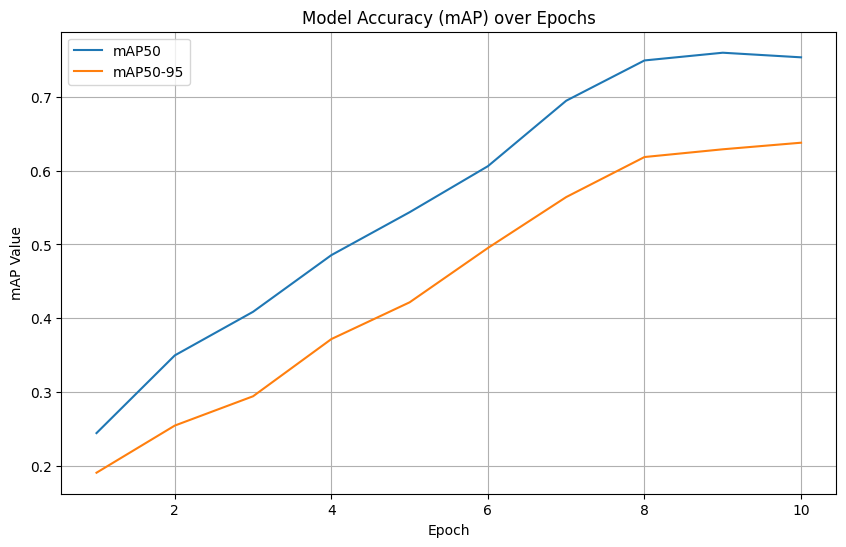

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Đường dẫn đến thư mục kết quả huấn luyện
# (Giả định 'results' là biến từ quá trình train hoặc bạn biết đường dẫn)
# Trong trường hợp này, dựa vào output training, thư mục là /content/runs_yolo12/exp_snake
results_dir = "/content/runs_yolo12/exp_snake"
results_csv_path = os.path.join(results_dir, "results.csv")

# Kiểm tra xem file results.csv có tồn tại không
if os.path.exists(results_csv_path):
    # Đọc file CSV vào DataFrame
    df = pd.read_csv(results_csv_path)

    # Lấy các cột cần thiết
    epochs = df['epoch']
    # accuracy metrics thường là metrics/mAP50(B) và metrics/mAP50-95(B)
    # Tên cột có thể khác tùy phiên bản Ultralytics, bạn có thể kiểm tra df.columns
    mAP50 = df['metrics/mAP50(B)']
    mAP50_95 = df['metrics/mAP50-95(B)']

    # Vẽ biểu đồ
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, mAP50, label='mAP50')
    plt.plot(epochs, mAP50_95, label='mAP50-95')

    plt.title('Model Accuracy (mAP) over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('mAP Value')
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print(f"Lỗi: Không tìm thấy file results.csv tại: {results_csv_path}. Vui lòng đảm bảo quá trình training đã hoàn tất thành công và tạo ra file này.")



--- Đánh giá mô hình trên tập Test ---
Ultralytics 8.3.234 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12n summary (fused): 159 layers, 2,560,823 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 1.2±1.2 ms, read: 7.8±17.2 MB/s, size: 51.2 KB)
val: Scanning /content/drive/MyDrive/SnakeAid.v4-masking-5k-image-.yolov12/test/labels... 197 images, 3 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 197/197 2.7it/s 1:12
val: New cache created: /content/drive/MyDrive/SnakeAid.v4-masking-5k-image-.yolov12/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 13/13 3.2it/s 4.1s
                   all        197        212      0.751      0.594      0.708      0.592
           cap_nia_bac          9         13      0.849      0.538      0.615      0.554
           cap_nia_nam          7          7      0.622      0.857      0.905       0.82
              cap_nong         12         13     

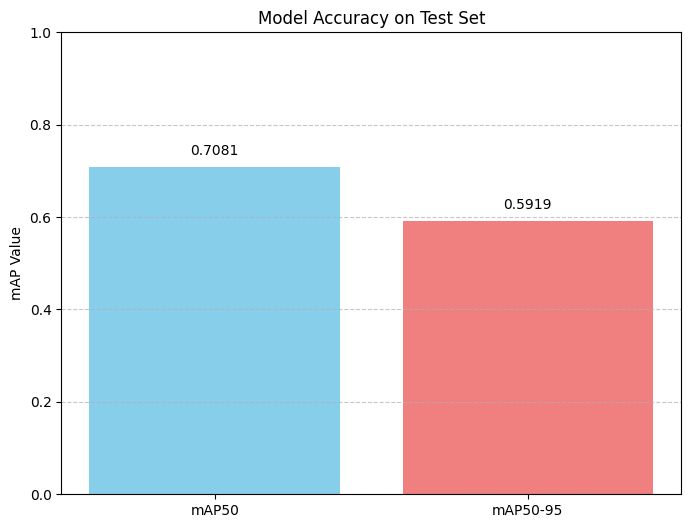

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import os

# Đường dẫn đến mô hình tốt nhất đã train
model_path = "/content/runs_yolo12/exp_snake/weights/best.pt"

# Đường dẫn đến file data.yaml của bạn
data_yaml_path = os.path.join(DATASET_ROOT, "data.yaml")

# Tải mô hình
model = YOLO(model_path)

print("\n--- Đánh giá mô hình trên tập Test ---")

# Chạy đánh giá trên tập test
metrics = model.val(data=data_yaml_path, split='test')

# Lấy các chỉ số mAP
mAP50_test = metrics.results_dict['metrics/mAP50(B)']
mAP50_95_test = metrics.results_dict['metrics/mAP50-95(B)']

print(f"\nmAP50 trên tập Test: {mAP50_test:.4f}")
print(f"mAP50-95 trên tập Test: {mAP50_95_test:.4f}")

# Vẽ biểu đồ trực quan
labels = ['mAP50', 'mAP50-95']
values = [mAP50_test, mAP50_95_test]

plt.figure(figsize=(8, 6))
plt.bar(labels, values, color=['skyblue', 'lightcoral'])
plt.ylim(0, 1) # mAP values range from 0 to 1
plt.title('Model Accuracy on Test Set')
plt.ylabel('mAP Value')

for i, v in enumerate(values):
    plt.text(i, v + 0.02, f'{v:.4f}', ha='center', va='bottom')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


### 3. Sử dụng mô hình đã huấn luyện để dự đoán

Processing images:   0%|          | 0/10 [00:00<?, ?it/s]



Dự đoán trên ảnh: anh_1.jpg (/content/drive/MyDrive/SnakeTraining_YOLOv12_Khiem_v1/demo/anh_1.jpg)
Các đối tượng rắn được phát hiện:
  - Loại: ho_mang_chua, Độ tin cậy: 1.00

Thông tin tốc độ:
  - Preprocess: 5.3ms
  - Inference: 13.1ms
  - Postprocess: 1.8ms


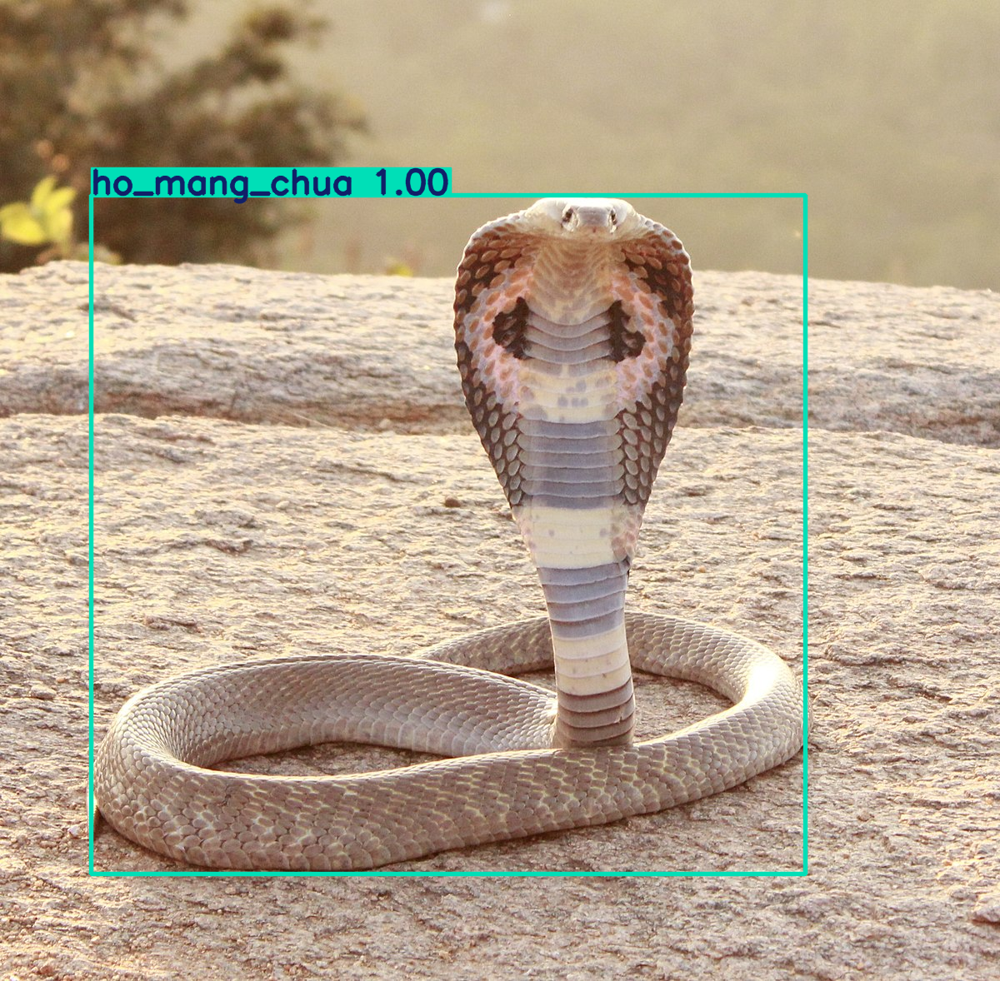

Processing images:  10%|█         | 1/10 [00:00<00:07,  1.13it/s]




Dự đoán trên ảnh: anh_2.png (/content/drive/MyDrive/SnakeTraining_YOLOv12_Khiem_v1/demo/anh_2.png)
Các đối tượng rắn được phát hiện:
  - Loại: ran_rao, Độ tin cậy: 0.69

Thông tin tốc độ:
  - Preprocess: 2.5ms
  - Inference: 85.2ms
  - Postprocess: 2.2ms


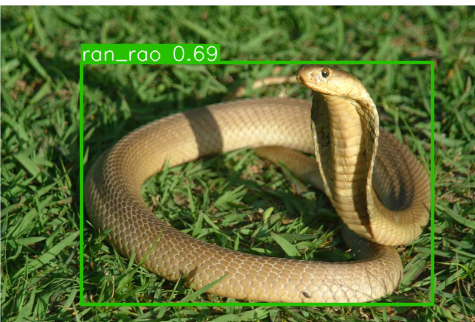

Processing images:  20%|██        | 2/10 [00:01<00:03,  2.22it/s]




Dự đoán trên ảnh: anh_3.jpg (/content/drive/MyDrive/SnakeTraining_YOLOv12_Khiem_v1/demo/anh_3.jpg)
Các đối tượng rắn được phát hiện:
  - Loại: ran_soc_go, Độ tin cậy: 0.47

Thông tin tốc độ:
  - Preprocess: 2.2ms
  - Inference: 91.1ms
  - Postprocess: 1.8ms


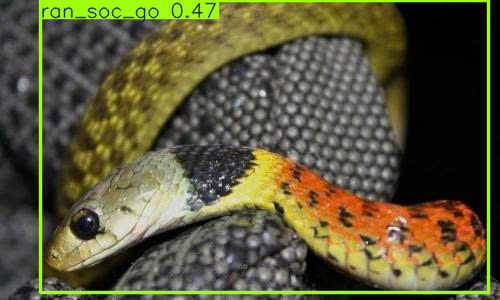

Processing images:  30%|███       | 3/10 [00:01<00:02,  3.27it/s]




Dự đoán trên ảnh: anh_4.png (/content/drive/MyDrive/SnakeTraining_YOLOv12_Khiem_v1/demo/anh_4.png)
Không thấy rắn trong hình.

Thông tin tốc độ:
  - Preprocess: 4.8ms
  - Inference: 16.6ms
  - Postprocess: 0.6ms


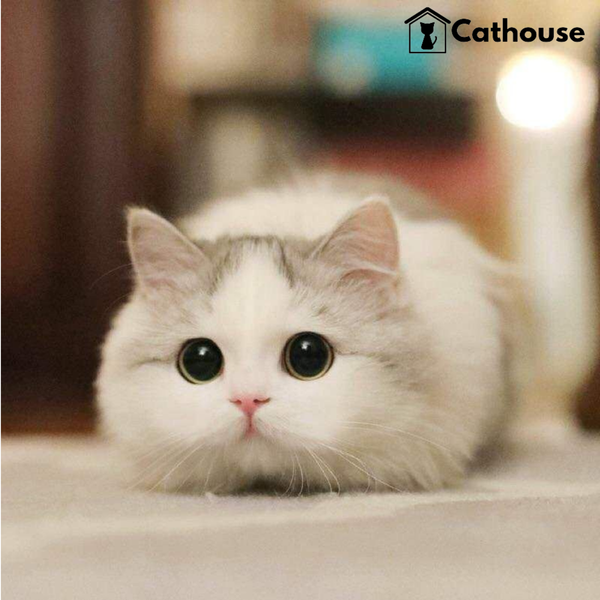

Processing images:  40%|████      | 4/10 [00:01<00:01,  4.34it/s]




Dự đoán trên ảnh: anh_5.jpg (/content/drive/MyDrive/SnakeTraining_YOLOv12_Khiem_v1/demo/anh_5.jpg)
Các đối tượng rắn được phát hiện:
  - Loại: luc_nua, Độ tin cậy: 0.35

Thông tin tốc độ:
  - Preprocess: 2.5ms
  - Inference: 18.4ms
  - Postprocess: 1.9ms


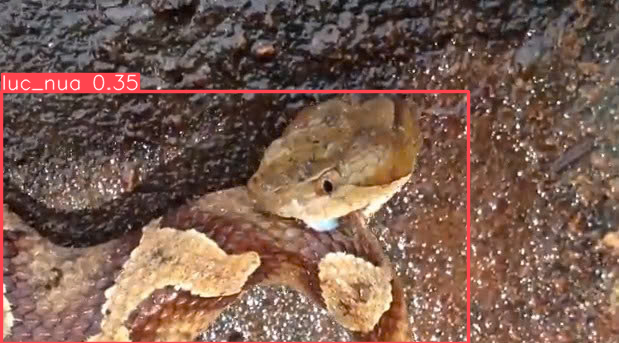




Dự đoán trên ảnh: anh_6.jpg (/content/drive/MyDrive/SnakeTraining_YOLOv12_Khiem_v1/demo/anh_6.jpg)
Không thấy rắn trong hình.

Thông tin tốc độ:
  - Preprocess: 5.9ms
  - Inference: 89.6ms
  - Postprocess: 0.8ms


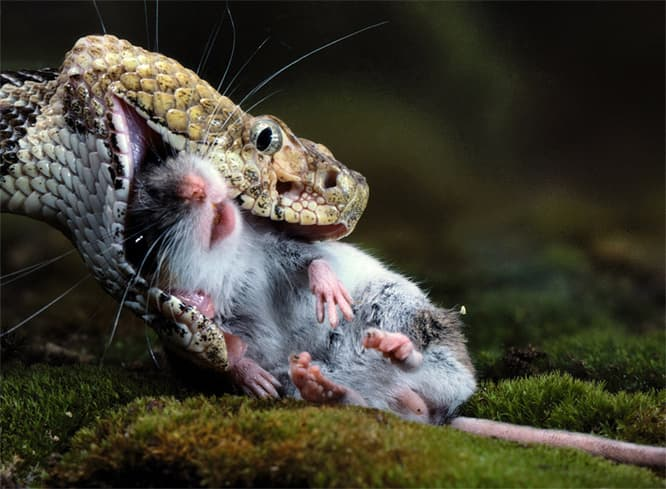

Processing images:  60%|██████    | 6/10 [00:01<00:00,  5.60it/s]




Dự đoán trên ảnh: anh_7.jpg (/content/drive/MyDrive/SnakeTraining_YOLOv12_Khiem_v1/demo/anh_7.jpg)
Các đối tượng rắn được phát hiện:
  - Loại: ran_roi, Độ tin cậy: 0.96

Thông tin tốc độ:
  - Preprocess: 3.3ms
  - Inference: 20.1ms
  - Postprocess: 1.8ms


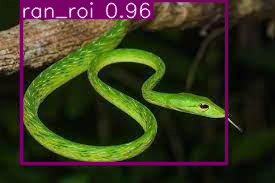




Dự đoán trên ảnh: anh_8.jpg (/content/drive/MyDrive/SnakeTraining_YOLOv12_Khiem_v1/demo/anh_8.jpg)
Các đối tượng rắn được phát hiện:
  - Loại: ran_rao, Độ tin cậy: 0.69

Thông tin tốc độ:
  - Preprocess: 2.4ms
  - Inference: 19.9ms
  - Postprocess: 2.2ms


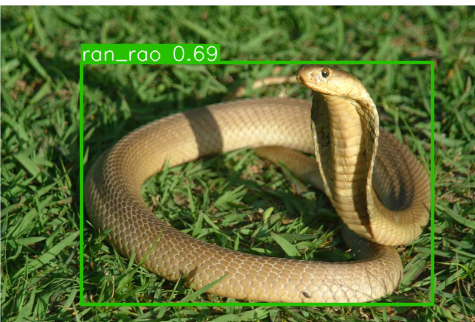

Processing images:  80%|████████  | 8/10 [00:01<00:00,  7.80it/s]




Dự đoán trên ảnh: anh_9.jpg (/content/drive/MyDrive/SnakeTraining_YOLOv12_Khiem_v1/demo/anh_9.jpg)
Các đối tượng rắn được phát hiện:
  - Loại: luc_nua, Độ tin cậy: 0.98

Thông tin tốc độ:
  - Preprocess: 4.3ms
  - Inference: 87.2ms
  - Postprocess: 2.0ms


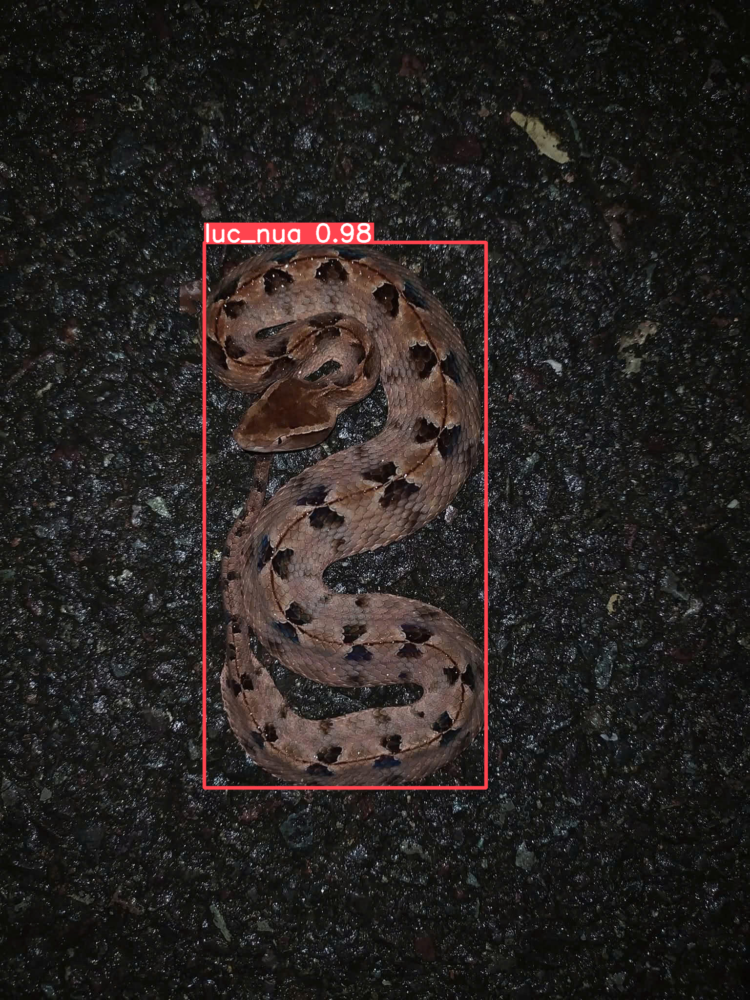




Dự đoán trên ảnh: anh_10.jpg (/content/drive/MyDrive/SnakeTraining_YOLOv12_Khiem_v1/demo/anh_10.jpg)
Các đối tượng rắn được phát hiện:
  - Loại: cap_nong, Độ tin cậy: 0.98

Thông tin tốc độ:
  - Preprocess: 3.0ms
  - Inference: 100.5ms
  - Postprocess: 4.4ms


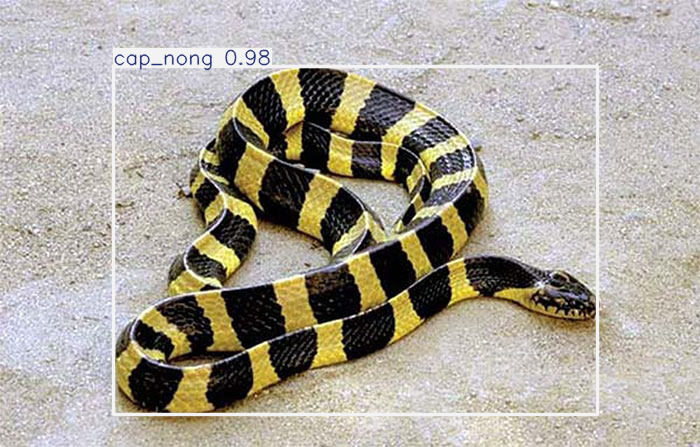

Processing images: 100%|██████████| 10/10 [00:02<00:00,  3.82it/s]

In [1]:
from ultralytics import YOLO
import cv2
from google.colab.patches import cv2_imshow # Sử dụng để hiển thị ảnh trong Colab
import os
from tqdm import tqdm # Đã thay đổi: Import tqdm tiêu chuẩn thay vì tqdm.notebook

# Đường dẫn đến mô hình tốt nhất đã train (từ thư mục output của Ultralytics trong Colab)
model_path = "/content/drive/MyDrive/SnakeTraining_YOLOv12_Khiem_v1/best.pt"

# Tải mô hình
model = YOLO(model_path)

# --- Cấu hình thư mục chứa ảnh và số lượng ảnh ---
images_directory = "/content/drive/MyDrive/SnakeTraining_YOLOv12_Khiem_v1/demo" # Thư mục chứa ảnh của bạn
num_images = 10
supported_extensions = ['.jpg', '.png', '.webp', '.jpeg'] # Thêm các định dạng file bạn muốn hỗ trợ

# Sử dụng tqdm để hiển thị thanh tiến trình
for i in tqdm(range(1, num_images + 1), desc="Processing images"):
    base_image_name = f"anh_{i}"
    input_image_path = None
    found_file = False

    for ext in supported_extensions:
        potential_path = os.path.join(images_directory, base_image_name + ext)
        if os.path.exists(potential_path):
            input_image_path = potential_path
            image_name = base_image_name + ext
            found_file = True
            break

    print(f"\n{'='*50}\n") # Dòng phân cách đẹp mắt

    if not found_file:
        print(f"Lỗi: Không tìm thấy file ảnh {base_image_name} với các định dạng hỗ trợ tại: {images_directory}. Bỏ qua ảnh này.")
        print(f"{'='*50}\n")
        continue # Bỏ qua ảnh này và chuyển sang ảnh tiếp theo
    else:
        print(f"Dự đoán trên ảnh: {image_name} ({input_image_path})")
        print(f"{'='*50}")

        # Thực hiện dự đoán trên ảnh
        # verbose=False để tắt output mặc định của Ultralytics và in log tùy chỉnh
        results = model.predict(source=input_image_path, conf=0.25, verbose=False)

        # Lấy kết quả của ảnh đầu tiên (và duy nhất) trong batch
        result = results[0]

        # Kiểm tra xem có đối tượng nào được phát hiện không
        if len(result.boxes) == 0:
            print("Không thấy rắn trong hình.") # Đã cập nhật thông báo
        else:
            print("Các đối tượng rắn được phát hiện:")
            for box in result.boxes:
                class_id = int(box.cls)
                class_name = result.names[class_id]
                confidence = float(box.conf)
                print(f"  - Loại: {class_name}, Độ tin cậy: {confidence:.2f}")

        # In thông tin tốc độ xử lý
        print("\nThông tin tốc độ:")
        for k, v in result.speed.items():
            print(f"  - {k.capitalize()}: {v:.1f}ms")

        # Hiển thị kết quả trực quan (sẽ hiển thị ảnh gốc nếu không có detections)
        annotated_frame = result.plot()

        # Hiển thị ảnh đã được dự đoán
        cv2_imshow(annotated_frame)

        print(f"{'='*50}\n") # Dòng phân cách đẹp mắt

        # Tùy chọn: Lưu ảnh kết quả
        # output_image_path = os.path.join(images_directory, f"predicted_{image_name}")
        # cv2.imwrite(output_image_path, annotated_frame)
        # print(f"Ảnh kết quả đã được lưu tại: {output_image_path}")
